PSF dataset downloaded from: https://edmond.mpdl.mpg.de/file.xhtml?fileId=101784&version=1.0

# Data Description
* The zip file contains MATLAB files, one for each lens and aperture setting. 
* Each MATLAB file contains a cell-array C, the array has the size (N, 4).
* N: # of measured PSF-patches for the given lens/aperture combination. 
* N is on the order of 4000. 
* The 4 entries are: 1: x-position, 2: y-position, 3: index of the exposure time, 4: 111x111x3 RGB patch of a PSF.
* The x/y-positions are the the pixels of the Canon 5DSR sensor.

# Necessary Libraries

In [8]:
import numpy as np
from scipy import signal
from scipy.io import loadmat
from scipy.ndimage import zoom
from scipy.spatial import cKDTree
import matplotlib.pyplot as plt
from pathlib import Path

# PSF Parsing

In [9]:
def load_psf_library(mat_file_path, filter_size=31):
    # Canon EOS 5DSR sensor specifications
    sensor_width_px = 8712
    sensor_height_px = 5808
    sensor_width_mm = 36.0
    sensor_height_mm = 24.0

    C = loadmat(mat_file_path)['C']
    N = C.shape[0]  # Number of PSF samples

    # extracting locations (pixel coordinates on Canon 5DSR sensor)
    X = np.array([C[n, 0][0][0] for n in range(N)]).astype(np.int64)
    Y = np.array([C[n, 1][0][0] for n in range(N)]).astype(np.int64)
    locations = np.stack([Y, X], axis=-1)  # (N, 2) - [y, x] format

    # extracting PSF kernels (111x111x3 RGB)
    kernels = np.array([C[n, 3] for n in range(N)]).astype(np.float32)

    # center cropping to desired filter size
    half_size = filter_size // 2
    central_pix = kernels.shape[1] // 2
    kernels = kernels[:, central_pix - half_size : central_pix + half_size + 1,
                     central_pix - half_size : central_pix + half_size + 1]

    # normalizing each PSF
    kernels /= (kernels.sum(axis=(1, 2, 3), keepdims=True) + 1e-6)

    # converting pixel locations to mm (centered at sensor center)
    locations_mm = np.zeros_like(locations, dtype=np.float32)
    locations_mm[:, 0] = ((locations[:, 0] - sensor_height_px / 2) / sensor_height_px) * sensor_height_mm  # Y
    locations_mm[:, 1] = ((locations[:, 1] - sensor_width_px / 2) / sensor_width_px) * sensor_width_mm    # X

    # flipping Y for standard coordinate system (Y increases upward)
    locations_mm[:, 0] = -locations_mm[:, 0]

    psf_library = {
        'lens_name': Path(mat_file_path).stem,
        'num_psfs': N,
        'filter_size': filter_size,
        'locations_px': locations,  # (N, 2) in [y, x] pixels
        'locations_mm': locations_mm[:, [1, 0]],  # (N, 2) in [x, y] mm for consistency
        'kernels': kernels,  # (N, filter_size, filter_size, 3)
        'sensor_size_px': (sensor_height_px, sensor_width_px),
        'sensor_size_mm': (sensor_width_mm, sensor_height_mm)
    }

    print(f"Lens: {psf_library['lens_name']}")
    print(f"PSF samples: {N}")
    print(f"Filter size: {filter_size} x {filter_size}")
    print(f"Sensor: {sensor_width_px} x {sensor_height_px} px ({sensor_width_mm} x {sensor_height_mm} mm)")
    print(f"Location range:")
    print(f"X: [{locations_mm[:, 1].min():.2f}, {locations_mm[:, 1].max():.2f}] mm")
    print(f"Y: [{locations_mm[:, 0].min():.2f}, {locations_mm[:, 0].max():.2f}] mm")

    return psf_library

# PSF Visualization

In [10]:
def visualize_psf_field_layout(psf_library, save_path=None):
    locations_mm = psf_library['locations_mm']  # (N, 2) [x, y]

    _, ax = plt.subplots(figsize=(15, 12))

    # scatter plot of PSF locations
    scatter = ax.scatter(locations_mm[:, 0], locations_mm[:, 1],
                        c=np.sqrt(locations_mm[:, 0]**2 + locations_mm[:, 1]**2),
                        cmap='magma', s=10, edgecolors='none')

    # sensor boundaries (approximate rectangle)
    sensor_w, sensor_h = psf_library['sensor_size_mm']
    rect = plt.Rectangle((-sensor_w/2, -sensor_h/2), sensor_w, sensor_h, 
                         fill=False, linestyle='--', linewidth=0.75)
    ax.add_patch(rect)
    ax.grid(True, linestyle='--')
    ax.set_xlabel('X (mm)',fontsize=14)
    ax.set_ylabel('Y (mm)', fontsize=14)
    ax.set_title(f'PSF Distribution of {len(locations_mm)} samples', fontsize=16)
    ax.set_aspect('equal')

    # radial distance
    plt.colorbar(scatter, ax=ax, label='Radial distance from center (mm)', shrink=0.65)

    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')

    plt.show()

In [11]:
def visualize_psf_grid(psf_library, num_samples=15, save_path=None):
    locations_mm = psf_library['locations_mm']  # (N, 2) [x, y]
    kernels = psf_library['kernels']  # (N, filter_size, filter_size, 3)
    psf_size = kernels.shape[1]  # filter_size

    x_positions = locations_mm[:, 0]
    y_positions = locations_mm[:, 1]

    x_min, x_max = x_positions.min(), x_positions.max()
    y_min, y_max = y_positions.min(), y_positions.max()

    x_samples = np.linspace(x_min, x_max, num_samples)
    y_samples = np.linspace(y_min, y_max, num_samples)

    grid_height = num_samples
    grid_width = num_samples

    canvas_height = grid_height * psf_size
    canvas_width = grid_width * psf_size
    canvas = np.zeros((canvas_height, canvas_width, 3), dtype=np.float32)

    # KD-tree for fast nearest neighbor lookup
    kdtree = cKDTree(locations_mm)

    for i in range(grid_height):
        y_sample = y_samples[grid_height - 1 - i]  # flipping Y for image coordinates
        for j in range(grid_width):
            x_sample = x_samples[j]
            _, nearest_idx = kdtree.query([x_sample, y_sample], k=1)
            psf = kernels[nearest_idx]
            psf_normalized = psf / (psf.max() + 1e-10)

            canvas_y1 = i * psf_size
            canvas_y2 = canvas_y1 + psf_size
            canvas_x1 = j * psf_size
            canvas_x2 = canvas_x1 + psf_size

            canvas[canvas_y1:canvas_y2, canvas_x1:canvas_x2, :] = psf_normalized

    # sqrt for better visualization
    canvas_display = np.sqrt(canvas)

    _, ax = plt.subplots(1, 1, figsize=(num_samples, num_samples))

    ax.imshow(canvas_display)
    ax.set_title(f'Spatially Arranged PSF Sensor Map Mosaic: {grid_height} x {grid_width} grid', fontsize=16)

    # adding position labels
    for i in range(0, grid_height):
        y_sample = y_samples[grid_height - 1 - i]
        for j in range(0, grid_width):
            x_sample = x_samples[j]

            text_x = j * psf_size + psf_size // 2
            text_y = i * psf_size + psf_size - 2

            ax.text(text_x, text_y, f'({x_sample:.0f}, {y_sample:.0f})',
                   fontsize=8, color='yellow', ha='center', va='bottom')

    ax.axis('off')
    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')

    plt.show()

Lens: Canon_EF16-35mm_16mm_f_2.8L_II_USM_PS_ap_2.8
PSF samples: 3971
Filter size: 32 x 32
Sensor: 8712 x 5808 px (36.0 x 24.0 mm)
Location range:
X: [-17.95, 18.09] mm
Y: [-12.17, 11.98] mm


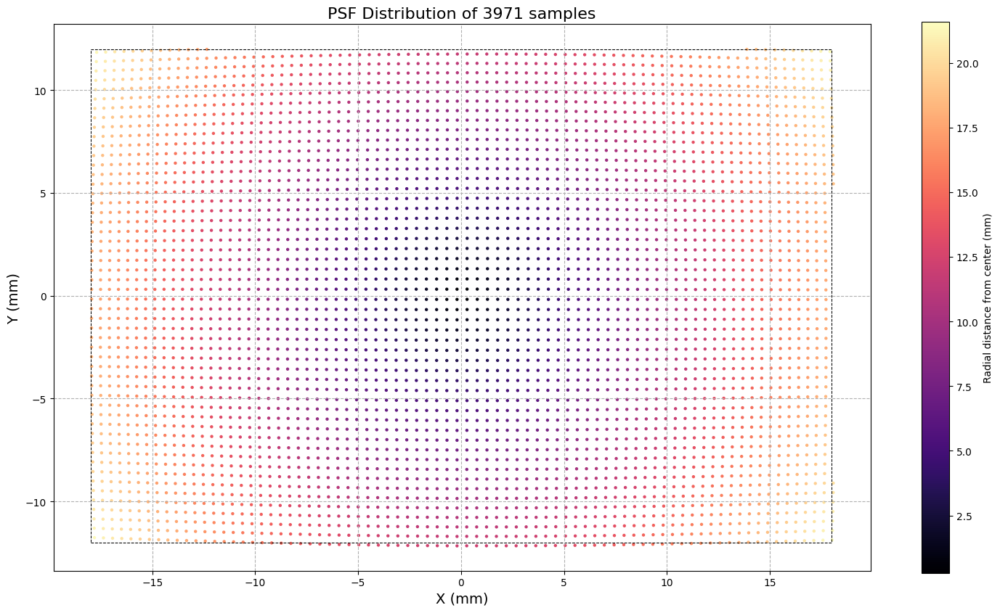

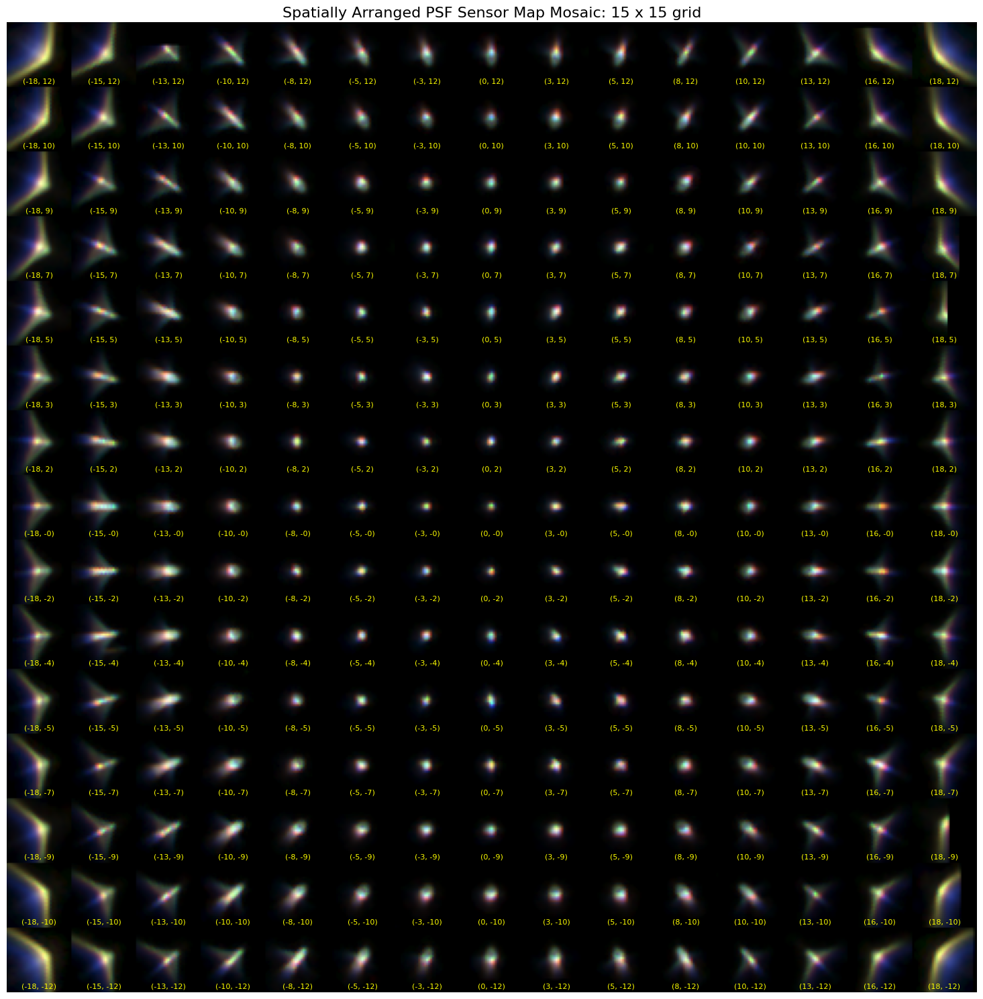

In [12]:
mat_file_path = "psf_library/Canon_EF16-35mm_16mm_f_2.8L_II_USM_PS_ap_2.8.mat"
psf_library = load_psf_library(mat_file_path, filter_size=32)
visualize_psf_field_layout(psf_library)
visualize_psf_grid(psf_library)

# Shift-Variant Convolution

In [13]:
def create_window_2d(size, window_type='hann', tukey_alpha=0.5):
    if window_type == 'hann':
        window_1d = signal.windows.hann(size, sym=True)
    elif window_type == 'tukey':
        window_1d = signal.windows.tukey(size, alpha=tukey_alpha, sym=True)
    elif window_type == 'bartlett':
        window_1d = signal.windows.bartlett(size)
    else:
        raise ValueError(f"Unknown window type: {window_type}. "
                        f"Supported: 'hann', 'tukey', 'bartlett'")

    window_2d = np.outer(window_1d, window_1d)

    return window_2d

In [14]:
def resize_psf(psf_rgb, target_size):
    H, W, _ = psf_rgb.shape
    if H == target_size and W == target_size:
        return psf_rgb

    zoom_factor = target_size / H
    resized = np.zeros((target_size, target_size, 3), dtype=np.float32)
    for c in range(3):
        resized[:, :, c] = zoom(psf_rgb[:, :, c], zoom_factor, order=1)
        resized[:, :, c] = resized[:, :, c] / (np.sum(resized[:, :, c]) + 1e-10)

    return resized

In [28]:
def overlap_add_convolution(image, psf_library, patch_size=128, overlap_ratio=0.5, 
                            sensor_size_mm=(36.0, 24.0), visualize_fields=False, window_type='hann'):
    if image.max() > 1.0:
        image = image.astype(np.float32) / 255.0

    if image.ndim == 2:
        image = np.stack([image, image, image], axis=-1)

    H_orig, W_orig, C = image.shape

    pad_size = patch_size // 2
    image = np.pad(image, ((pad_size, pad_size), (pad_size, pad_size), (0, 0)), mode='reflect')
    H, W, C = image.shape

    print(f"Original image size: {H_orig}x{W_orig}")
    print(f"Padded image size: {H}x{W} ({pad_size}px per side)")

    step_size = int(patch_size * (1 - overlap_ratio))
    num_patches_y = int(np.ceil((H - patch_size) / step_size)) + 1
    num_patches_x = int(np.ceil((W - patch_size) / step_size)) + 1

    output = np.zeros_like(image, dtype=np.float64)
    weight_map = np.zeros((H, W, C), dtype=np.float64)

    window_2d = create_window_2d(patch_size, window_type=window_type)
    window_2d = np.repeat(window_2d[:, :, np.newaxis], C, axis=2)

    kdtree = cKDTree(psf_library['locations_mm'])

    pixel_to_mm_x = sensor_size_mm[0] / W
    pixel_to_mm_y = sensor_size_mm[1] / H
    center_x, center_y = W / 2, H / 2

    print(f"Processing with {patch_size}px patches")
    print(f"Overlap ratio: {overlap_ratio}, Step size: {step_size}px")
    print(f"Grid size: {num_patches_y} x {num_patches_x} patches\n")

    if visualize_fields:
        field_info = []  # stores (patch_center, psf_index, sensor_pos)

    patch_count = 0

    for i in range(num_patches_y):
        y_start = min(i * step_size, H - patch_size)
        y_end = y_start + patch_size

        for j in range(num_patches_x):
            x_start = min(j * step_size, W - patch_size)
            x_end = x_start + patch_size

            actual_patch = image[y_start:y_end, x_start:x_end, :]

            patch_center_x = x_start + patch_size / 2
            patch_center_y = y_start + patch_size / 2

            pos_mm_x = (patch_center_x - center_x) * pixel_to_mm_x
            pos_mm_y = (center_y - patch_center_y) * pixel_to_mm_y  # flip y

            _, nearest_idx = kdtree.query((pos_mm_x, pos_mm_y), k=1)
            psf = resize_psf(psf_library['kernels'][nearest_idx], patch_size)

            if visualize_fields:
                orig_center_x = patch_center_x - pad_size
                orig_center_y = patch_center_y - pad_size
                field_info.append({
                    'center': (orig_center_x, orig_center_y),
                    'psf_idx': nearest_idx,
                    'sensor_pos': (pos_mm_x, pos_mm_y)
                })

            blurred_patch = np.zeros_like(actual_patch)
            for c in range(C):
                blurred_patch[:, :, c] = signal.fftconvolve(
                    actual_patch[:, :, c], 
                    psf[:, :, c], 
                    mode='same'
                )

            windowed_patch = blurred_patch * window_2d
            output[y_start:y_end, x_start:x_end, :] += windowed_patch
            weight_map[y_start:y_end, x_start:x_end, :] += window_2d

            patch_count += 1
            if patch_count % 1000 == 0:
                print(f"Processed {patch_count}/{num_patches_y * num_patches_x} patches")

    output = output / (weight_map + 1e-10)
    output = output[pad_size:pad_size+H_orig, pad_size:pad_size+W_orig, :]
    output = np.clip(output, 0, 1.0)

    print(f"Total patches processed: {patch_count}")
    print(f"Output size: {output.shape[0]}x{output.shape[1]}")

    if visualize_fields:
        return output, field_info
    return output

# Visualizing Overlap-and-Add Convolution

In [46]:
def generate_point_source_grid(image_size=(2048, 2048), grid_spacing=256, point_width=3, intensity=1.0):
    H, W = image_size
    image = np.zeros((H, W, 3), dtype=np.float32)

    y_positions = np.arange(grid_spacing//2, H, grid_spacing)
    x_positions = np.arange(grid_spacing//2, W, grid_spacing)

    print(f"Creating {len(y_positions)} x {len(x_positions)} = {len(y_positions)*len(x_positions)} point sources")

    half_width = point_width // 2
    for y in y_positions:
        for x in x_positions:
            y1 = max(0, y - half_width)
            y2 = min(H, y + half_width + 1)
            x1 = max(0, x - half_width)
            x2 = min(W, x + half_width + 1)

            image[y1:y2, x1:x2, :] = intensity

    return image

In [47]:
def visualize_point_source_convolution(original_point_grid, blurred_point_grid, save_path=None):
    _, axes = plt.subplots(1, 2, figsize=(16, 8))
    axes[0].imshow(original_point_grid)
    axes[0].set_title('Original Point Sources')
    axes[0].axis('off')

    axes[1].imshow(blurred_point_grid)
    axes[1].set_title('After Shift-Variant PSF')
    axes[1].axis('off')

    plt.tight_layout()
    if save_path: 
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()

Creating 32 x 32 = 1024 point sources
Original image size: 2048x2048
Padded image size: 2112x2112 (32px per side)
Processing with 64px patches
Overlap ratio: 0.75, Step size: 16px
Grid size: 129 x 129 patches

Processed 1000/16641 patches
Processed 2000/16641 patches
Processed 3000/16641 patches
Processed 4000/16641 patches
Processed 5000/16641 patches
Processed 6000/16641 patches
Processed 7000/16641 patches
Processed 8000/16641 patches
Processed 9000/16641 patches
Processed 10000/16641 patches
Processed 11000/16641 patches
Processed 12000/16641 patches
Processed 13000/16641 patches
Processed 14000/16641 patches
Processed 15000/16641 patches
Processed 16000/16641 patches
Total patches processed: 16641
Output size: 2048x2048


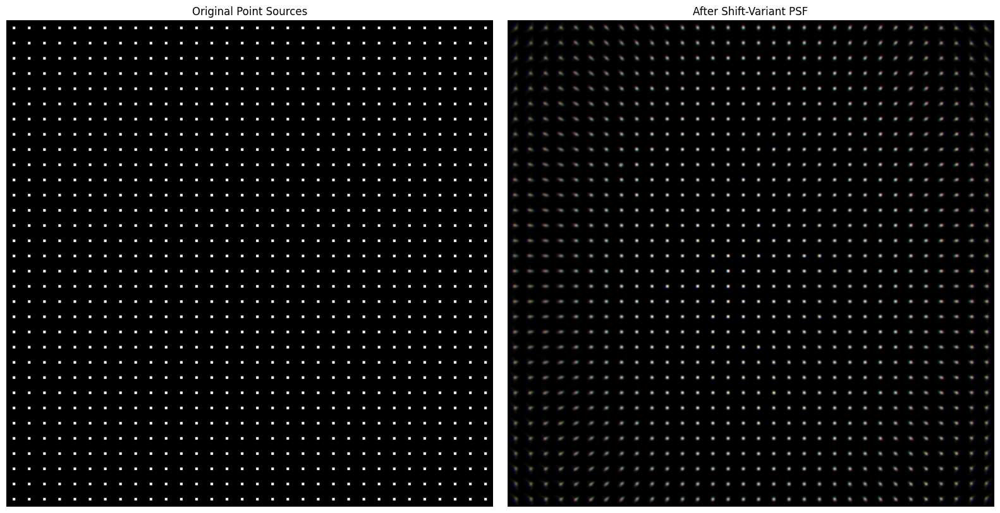

In [49]:
point_grid = generate_point_source_grid(
    image_size=(2048, 2048),
    grid_spacing=64,
    point_width=10,
    intensity=1.0
)

blurred_grid = overlap_add_convolution(
    point_grid,
    psf_library,
    patch_size=64,
    overlap_ratio=0.75,
)

visualize_point_source_convolution(point_grid, blurred_grid)

# Visualizing Convolution Pipeline

In [21]:
def visualize_field_assignment(image, field_info, psf_library, save_path=None):
    if image.max() > 1.0:
        image = image / 255.0

    _, axes = plt.subplots(1, 2, figsize=(22, 11))

    locations_mm = psf_library['locations_mm']

    axes[0].imshow(image)
    step = max(1, len(field_info) // 100)  # subsampling to avoid clutter
    for info in field_info[::step]:
        cx, cy = info['center']
        sensor_x, sensor_y = info['sensor_pos']

        axes[0].plot(cx, cy, 'ro')
        axes[0].text(cx, cy, f'({sensor_x:.1f}, {sensor_y:.1f})', fontsize=7, color='yellow', ha='center', va='bottom',
                    bbox=dict(boxstyle='round, pad=0.2', facecolor='black'))

    axes[0].set_title('Field Coordinates Overlay', fontsize=14)
    axes[0].axis('off')

    radial_distances = []
    for info in field_info:
        psf_idx = info['psf_idx']
        pos = locations_mm[psf_idx]
        r = np.sqrt(pos[0]**2 + pos[1]**2)
        radial_distances.append(r)

    axes[1].hist(radial_distances, bins=30, color='skyblue', edgecolor='black')
    axes[1].set_xlabel('Radial Distance from Center (mm)', fontsize=12)
    axes[1].set_ylabel('Number of Patches', fontsize=12)
    axes[1].set_title('PSF Kernel Usage Frequency by Radial Distance', fontsize=14)
    axes[1].grid(True, axis='y', linestyle="--")

    plt.suptitle(f'PSF Field Assignment Visualization', fontsize=16)
    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')

    plt.show()

In [22]:
def visualize_comparison(original, blurred, crop_coords=None, save_path=None):
    if original.max() > 1.0:
        original = original / 255.0
    if blurred.max() > 1.0:
        blurred = blurred / 255.0

    H, W = original.shape[:2]

    if crop_coords is None:
        crop_size = min(H, W) // 4
        y = H // 2 - crop_size // 2
        x = W // 2 - crop_size // 2
    else:
        y, x, crop_size = crop_coords

    orig_crop = original[y:y+crop_size, x:x+crop_size]
    blur_crop = blurred[y:y+crop_size, x:x+crop_size]

    _, axes = plt.subplots(2, 2, figsize=(16, 16))
    axes = axes.flatten()

    # full images
    axes[0].imshow(original)
    axes[0].set_title('Original Image', fontsize=14)
    rect = plt.Rectangle((x, y), crop_size, crop_size, linewidth=2, edgecolor='red', facecolor='none')
    axes[0].add_patch(rect)
    axes[0].axis('off')

    axes[1].imshow(blurred)
    axes[1].set_title('Shift-Variant Blurred', fontsize=14)
    rect = plt.Rectangle((x, y), crop_size, crop_size, linewidth=2, edgecolor='red', facecolor='none')
    axes[1].add_patch(rect)
    axes[1].axis('off')

    # detail crops
    axes[2].imshow(orig_crop)
    axes[2].set_title('Original Image (Detail)', fontsize=14)
    axes[2].axis('off')

    axes[3].imshow(blur_crop)
    axes[3].set_title('Shift-Variant Blurred (Detail)', fontsize=14)
    axes[3].axis('off')

    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')

    plt.show()

Lens: Canon_EF16-35mm_16mm_f_2.8L_II_USM_PS_ap_2.8
PSF samples: 3971
Filter size: 31 x 31
Sensor: 8712 x 5808 px (36.0 x 24.0 mm)
Location range:
X: [-17.95, 18.09] mm
Y: [-12.17, 11.98] mm
Original image size: 2040x2040
Padded image size: 2104x2104 (32px per side)
Processing with 64px patches
Overlap ratio: 0.75, Step size: 16px
Grid size: 129 x 129 patches

Processed 1000/16641 patches
Processed 2000/16641 patches
Processed 3000/16641 patches
Processed 4000/16641 patches
Processed 5000/16641 patches
Processed 6000/16641 patches
Processed 7000/16641 patches
Processed 8000/16641 patches
Processed 9000/16641 patches
Processed 10000/16641 patches
Processed 11000/16641 patches
Processed 12000/16641 patches
Processed 13000/16641 patches
Processed 14000/16641 patches
Processed 15000/16641 patches
Processed 16000/16641 patches
Total patches processed: 16641
Output size: 2040x2040


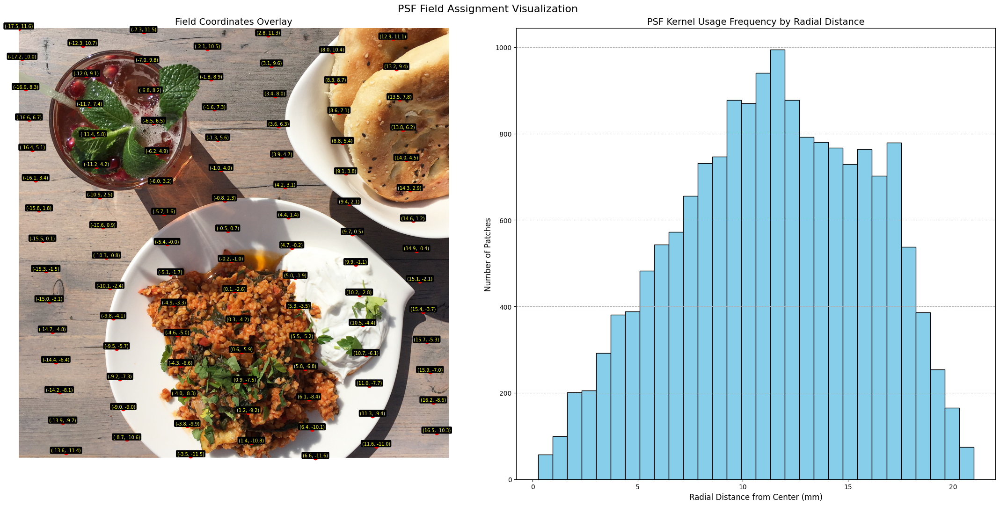

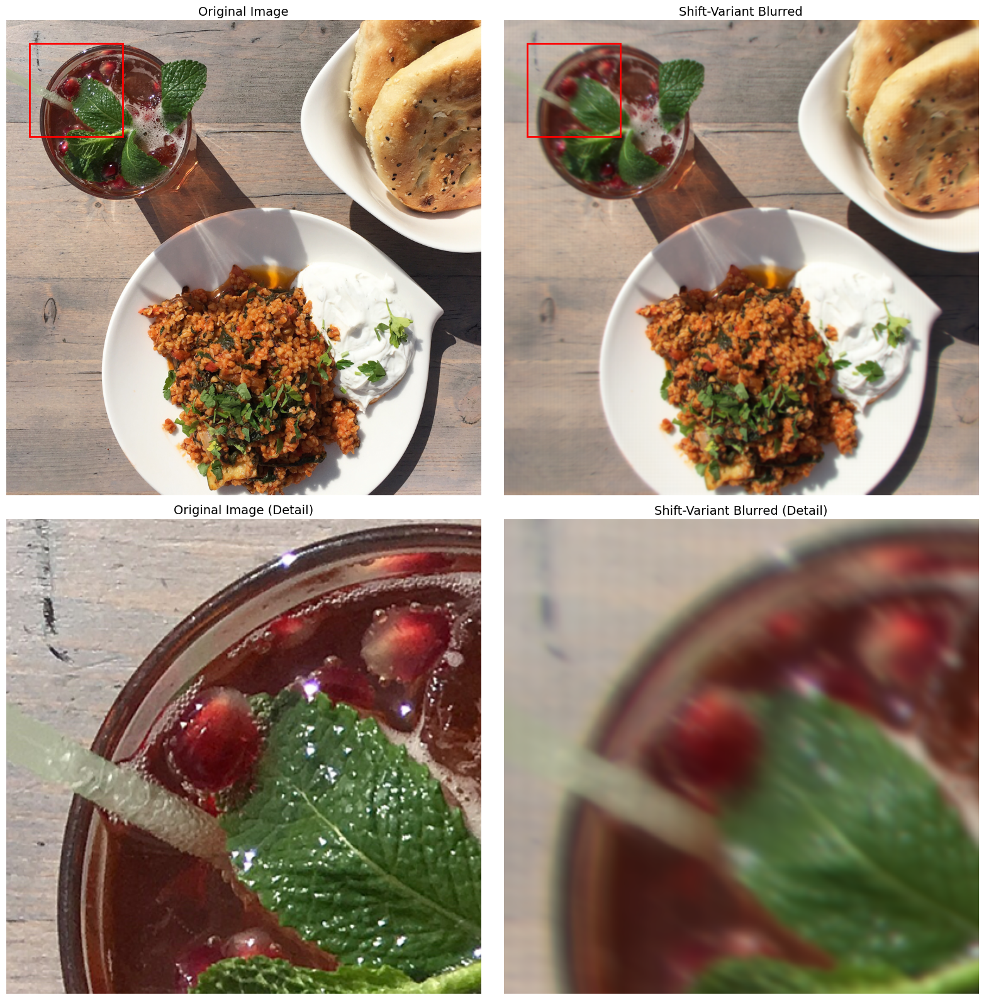

In [30]:
mat_file_path = "psf_library/Canon_EF16-35mm_16mm_f_2.8L_II_USM_PS_ap_2.8.mat"
psf_library = load_psf_library(mat_file_path)
test_image = plt.imread("000017.png")

blurred_image, field_info = overlap_add_convolution(
    test_image,
    psf_library,
    patch_size=64,
    overlap_ratio=0.75,
    sensor_size_mm=(36, 24),
    visualize_fields=True,
    )

visualize_field_assignment(test_image, field_info, psf_library)

visualize_comparison(test_image, blurred_image, crop_coords=(100, 100, 400))

# plt.imsave(f"blurred_image.png", blurred_image)

# Visualizing Effects of Patch Size and Overlap Ratio

In [13]:
def patch_detail_comparison(blurred_patches, save_path=None):
    _, axes = plt.subplots(3, len(blurred_patches)//3, figsize=(30, 15))
    axes = axes.flatten()

    for i, (title, blurred_patch) in enumerate(blurred_patches.items()):
        if blurred_patch.max() > 1.0:
            blurred_patch = blurred_patch / 255.0
        axes[i].imshow(blurred_patch)
        axes[i].set_title(title)
        axes[i].axis('off')

    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')

    plt.show()

Lens: Canon_EF16-35mm_16mm_f_2.8L_II_USM_PS_ap_2.8
PSF samples: 3971
Filter size: 31 x 31
Sensor: 8712 x 5808 px (36.0 x 24.0 mm)
Location range:
X: [-17.95, 18.09] mm
Y: [-12.17, 11.98] mm
Original image size: 2040x2040
Padded image size: 2168x2168 (64px per side)
Processing with 128px patches
Overlap ratio: 0.5, Step size: 64px
Grid size: 33 x 33 patches

Processed 1000/1089 patches
Total patches processed: 1089
Output size: 2040x2040
Original image size: 2040x2040
Padded image size: 2104x2104 (32px per side)
Processing with 64px patches
Overlap ratio: 0.5, Step size: 32px
Grid size: 65 x 65 patches

Processed 1000/4225 patches
Processed 2000/4225 patches
Processed 3000/4225 patches
Processed 4000/4225 patches
Total patches processed: 4225
Output size: 2040x2040
Original image size: 2040x2040
Padded image size: 2072x2072 (16px per side)
Processing with 32px patches
Overlap ratio: 0.5, Step size: 16px
Grid size: 129 x 129 patches

Processed 1000/16641 patches
Processed 2000/16641 patc

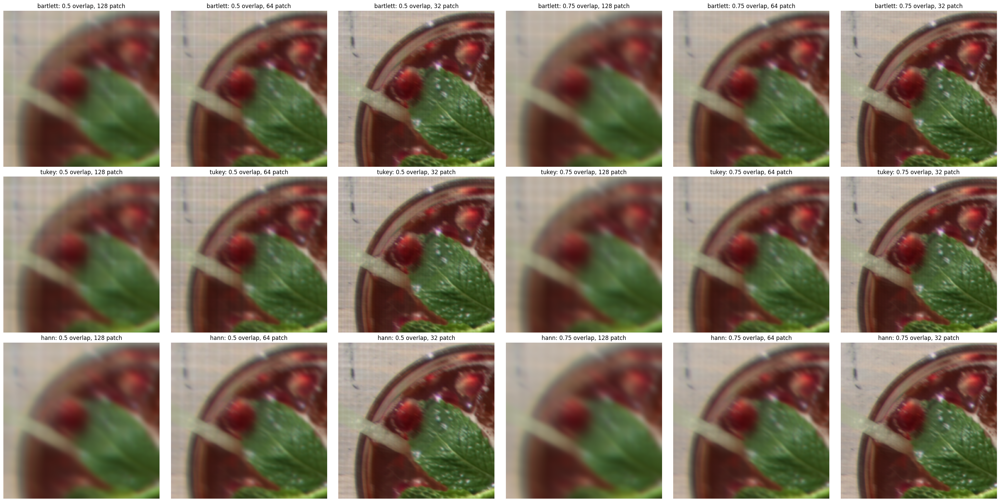

In [15]:
window_options = ['bartlett', 'tukey', 'hann']
overlap_ratios = [0.5, 0.75]
patch_sizes = [128, 64, 32]

mat_file_path = "psf_library/Canon_EF16-35mm_16mm_f_2.8L_II_USM_PS_ap_2.8.mat"
psf_library = load_psf_library(mat_file_path)
test_image = plt.imread("000017.png")

H, W = test_image.shape[:2]
y, x, crop_size=(100, 100, 400)

orig_crop = test_image[y:y+crop_size, x:x+crop_size]
blurred_patches = {}

for window_option in window_options:
    for overlap_ratio in overlap_ratios:
        for patch_size in patch_sizes:
            blurred_image, field_info = overlap_add_convolution(
                test_image,
                psf_library,
                patch_size=patch_size,
                overlap_ratio=overlap_ratio,
                sensor_size_mm=(36, 24),
                visualize_fields=True, 
                window_type=window_option
                )
            blur_crop = blurred_image[y:y+crop_size, x:x+crop_size]
            blurred_patches[f'{window_option}: {overlap_ratio} overlap, {patch_size} patch'] = blur_crop

patch_detail_comparison(blurred_patches, save_path='blurred_patch_comparison.png')